# Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

# Objective

- To predict the churn in the last month (i.e. the ninth) using the data (features) from the first three months
- To identify important predictor attributes which help the business understand indicators of churn
- To recommend strategies to manage customer churn based on your observations

## Step by Step Approach

- Step 1: Reading and understanding the dataset
- Step 2: Data Cleansing (Handling missing values, Data cleaning for rows)
- Step 3: Filtering High Value Customers using 6th and 7th month data (good phase)
- Step 4: Derive Churn using 9th month data (churn pahase)
- Step 5: Drop 9th month data (churn pahase)
- Step 6: Data Preparation (Deriving Variables, EDA, Outlier Treatment, Handling class imbalance, Splitting the data into Train and Test, Scaling)
- Step 7: Model Building (Building 1 Interpretable Model without PCA and 3 High Performance Model with PCA)
- Step 8: Model Evaluation (Confusion Matrix, Accuracy Score, Precision, Recall and F1 Score)

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None) # to see all the columns
pd.set_option('display.max_rows', None) # to see all the rows

import warnings
warnings.filterwarnings('ignore')

#### Step 1: Reading and understanding the dataset

In [2]:
tel_churn = pd.read_csv('telecom_churn_data.csv')
tel_churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
tel_churn.shape

(99999, 226)

In [4]:
tel_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [5]:
tel_churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [6]:
tel_churn.columns[tel_churn.dtypes=='object']

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9'],
      dtype='object')

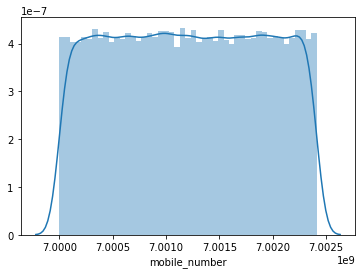

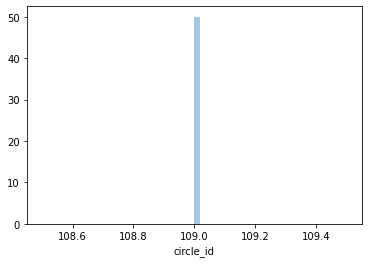

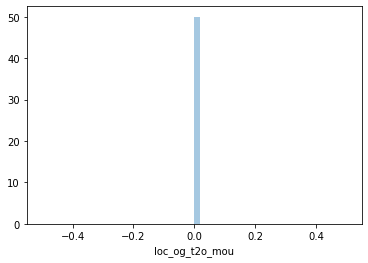

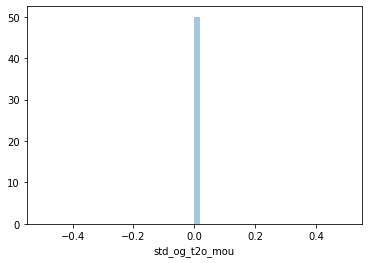

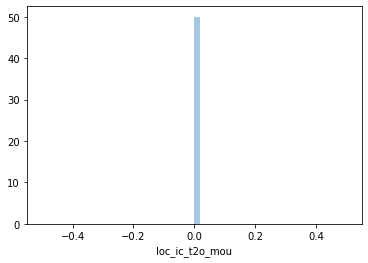

...

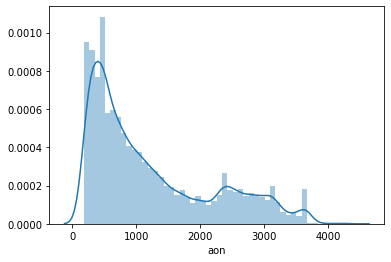

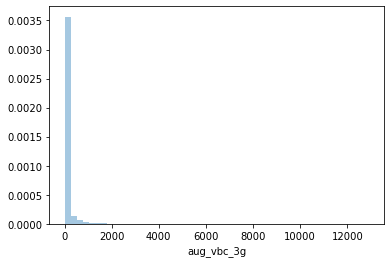

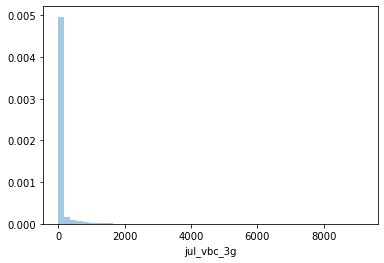

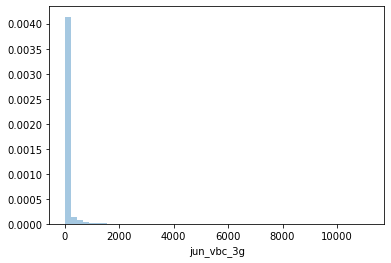

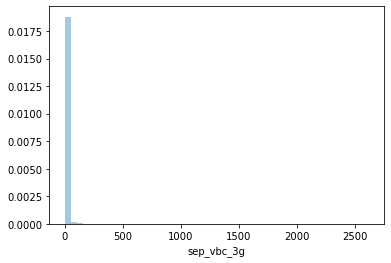

In [7]:
for i in tel_churn.describe().columns:
    sns.distplot(tel_churn[i])
    plt.show()

Observation: The data for most of the variables are right skewed

#### Step 2: Data Cleansing (Handling missing values, Data cleaning for rows and Outlier Treatment)

In [8]:
#find out missing values in all columns
tel_churn.isnull().sum().sort_values(ascending=False)


count_rech_2g_6             74846
date_of_last_rech_data_6    74846
count_rech_3g_6             74846
av_rech_amt_data_6          74846
max_rech_data_6             74846
total_rech_data_6           74846
arpu_3g_6                   74846
arpu_2g_6                   74846
night_pck_user_6            74846
fb_user_6                   74846
arpu_3g_7                   74428
count_rech_2g_7             74428
fb_user_7                   74428
count_rech_3g_7             74428
arpu_2g_7                   74428
av_rech_amt_data_7          74428
max_rech_data_7             74428
night_pck_user_7            74428
total_rech_data_7           74428
date_of_last_rech_data_7    74428
night_pck_user_9            74077
date_of_last_rech_data_9    74077
fb_user_9                   74077
arpu_2g_9                   74077
max_rech_data_9             74077
arpu_3g_9                   74077
total_rech_data_9           74077
av_rech_amt_data_9          74077
count_rech_3g_9             74077
count_rech_2g_

Observation: We have a missing values for most of the columns

In [9]:
#Find columns which are having more than 50% missing values
fifty_perc_rows=len(tel_churn)/2
drop_col_50_perc=tel_churn.columns[tel_churn.isna().sum()>fifty_perc_rows]
drop_col_50_perc

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6',
       'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7',
       'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9'],
      dtype='object')

In [10]:
#drop columns which are having more than 50% missing values
tel_churn.drop(drop_col_50_perc,axis=1,inplace=True)
tel_churn.shape

(99999, 186)

In [11]:
tel_churn.isnull().sum().sort_values(ascending=False)

loc_ic_t2m_mou_9        7745
std_og_t2t_mou_9        7745
std_ic_t2f_mou_9        7745
std_ic_t2t_mou_9        7745
roam_og_mou_9           7745
loc_ic_mou_9            7745
loc_og_t2t_mou_9        7745
loc_ic_t2f_mou_9        7745
roam_ic_mou_9           7745
ic_others_9             7745
loc_og_mou_9            7745
std_ic_t2o_mou_9        7745
offnet_mou_9            7745
loc_ic_t2t_mou_9        7745
std_ic_mou_9            7745
onnet_mou_9             7745
og_others_9             7745
std_og_mou_9            7745
isd_ic_mou_9            7745
std_og_t2m_mou_9        7745
std_og_t2f_mou_9        7745
loc_og_t2f_mou_9        7745
std_og_t2c_mou_9        7745
spl_ic_mou_9            7745
isd_og_mou_9            7745
loc_og_t2c_mou_9        7745
spl_og_mou_9            7745
loc_og_t2m_mou_9        7745
std_ic_t2m_mou_9        7745
spl_ic_mou_8            5378
std_ic_t2f_mou_8        5378
isd_ic_mou_8            5378
std_ic_t2o_mou_8        5378
loc_og_mou_8            5378
loc_ic_t2f_mou

In [12]:
#Find missing values count for rows
missing_values_rows=tel_churn.isnull().sum(axis=1)
missing_values_rows

0         87
1          0
2          0
3          0
4          0
5          0
6          0
7         29
8          0
9          0
10        29
11         1
12         0
13         0
14         0
15        29
16         0
17         0
18         0
19         0
20         0
21         0
22         0
23         0
24         0
25         0
26        30
27         0
28         0
29        29
30         0
31         0
32        29
33         0
34         0
35        87
36         0
37        29
38         0
39         0
40         0
41         0
42         0
43         0
44         0
45        87
46         0
47         0
48         0
49         0
50         0
51        30
52         1
53         0
54         0
55         0
56         0
57         0
58         0
59         0
60         0
61         0
62         0
63         0
64         0
65         0
66         0
67        31
68        59
69         0
70         0
71         0
72         1
73         0
74         0
75         0
76         0

In [13]:
missing_perc_rows=missing_values_rows/186*100
missing_perc_rows

0        46.774194
1         0.000000
2         0.000000
3         0.000000
4         0.000000
5         0.000000
6         0.000000
7        15.591398
8         0.000000
9         0.000000
10       15.591398
11        0.537634
12        0.000000
13        0.000000
14        0.000000
15       15.591398
16        0.000000
17        0.000000
18        0.000000
19        0.000000
20        0.000000
21        0.000000
22        0.000000
23        0.000000
24        0.000000
25        0.000000
26       16.129032
27        0.000000
28        0.000000
29       15.591398
30        0.000000
31        0.000000
32       15.591398
33        0.000000
34        0.000000
35       46.774194
36        0.000000
37       15.591398
38        0.000000
39        0.000000
40        0.000000
41        0.000000
42        0.000000
43        0.000000
44        0.000000
45       46.774194
46        0.000000
47        0.000000
48        0.000000
49        0.000000
50        0.000000
51       16.129032
52        0.

In [14]:
#Drop the rows which are having more than 50% missing values
tel_churn=tel_churn[missing_perc_rows<50]
tel_churn.shape

(98716, 186)

In [15]:
tel_churn.columns[tel_churn.dtypes=='object']

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9'],
      dtype='object')

In [16]:
#Drop all the date columns
date_cols=tel_churn.columns[tel_churn.dtypes=='object']
tel_churn.drop(date_cols,axis=1,inplace=True)
tel_churn.shape

(98716, 178)

In [17]:
tel_churn.isna().sum().sort_values(ascending=False)

loc_ic_t2m_mou_9      6462
loc_og_t2m_mou_9      6462
std_ic_t2t_mou_9      6462
loc_og_t2t_mou_9      6462
std_ic_t2f_mou_9      6462
loc_ic_mou_9          6462
roam_og_mou_9         6462
loc_ic_t2f_mou_9      6462
isd_ic_mou_9          6462
std_og_t2t_mou_9      6462
roam_ic_mou_9         6462
loc_og_t2f_mou_9      6462
loc_ic_t2t_mou_9      6462
std_ic_t2o_mou_9      6462
offnet_mou_9          6462
std_ic_mou_9          6462
std_og_t2m_mou_9      6462
loc_og_mou_9          6462
ic_others_9           6462
std_og_t2f_mou_9      6462
spl_ic_mou_9          6462
std_og_t2c_mou_9      6462
og_others_9           6462
std_og_mou_9          6462
isd_og_mou_9          6462
loc_og_t2c_mou_9      6462
spl_og_mou_9          6462
onnet_mou_9           6462
std_ic_t2m_mou_9      6462
spl_ic_mou_8          4096
std_ic_t2o_mou_8      4096
std_og_t2t_mou_8      4096
std_ic_t2f_mou_8      4096
loc_ic_t2f_mou_8      4096
std_ic_t2m_mou_8      4096
std_ic_t2t_mou_8      4096
loc_ic_mou_8          4096
l

In [18]:
#Find columns which are having less than 3000 missing values0
impute_cols_zero=tel_churn.columns[(tel_churn.isna().sum()<3000) & (tel_churn.isna().sum()>0)]
impute_cols_zero

Index(['onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7',
       'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_og_mou_6', 'roam_og_mou_7',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_mou_6', 'loc_og_mou_7',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_mou_6', 'std_og_mou_7',
       'isd_og_mou_6', 'isd_og_mou_7', 'spl_og_mou_6', 'spl_og_mou_7',
       'og_others_6', 'og_others_7', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_6',
       'loc_ic_t2f_mou_7', 'loc_ic_mou_6', 'loc_ic_mou_7', 'std_ic_t2t_mou_6',
       'std_ic_t2t_mou_7', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7',
       'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2o_mou_6',
  

In [19]:
#Impute columns with less than 3000 missing values with 0
tel_churn[impute_cols_zero]=tel_churn[impute_cols_zero].fillna(value=0)
tel_churn.isna().sum().sort_values(ascending=False)

loc_ic_t2m_mou_9      6462
loc_og_t2m_mou_9      6462
std_ic_t2m_mou_9      6462
loc_og_mou_9          6462
roam_og_mou_9         6462
std_ic_t2f_mou_9      6462
std_og_t2f_mou_9      6462
loc_og_t2t_mou_9      6462
std_ic_t2o_mou_9      6462
std_ic_mou_9          6462
std_og_t2c_mou_9      6462
std_og_t2m_mou_9      6462
loc_og_t2f_mou_9      6462
std_og_t2t_mou_9      6462
spl_ic_mou_9          6462
loc_og_t2c_mou_9      6462
og_others_9           6462
isd_ic_mou_9          6462
roam_ic_mou_9         6462
ic_others_9           6462
loc_ic_t2f_mou_9      6462
offnet_mou_9          6462
spl_og_mou_9          6462
loc_ic_mou_9          6462
onnet_mou_9           6462
loc_ic_t2t_mou_9      6462
std_og_mou_9          6462
std_ic_t2t_mou_9      6462
isd_og_mou_9          6462
std_og_t2m_mou_8      4096
spl_og_mou_8          4096
std_og_t2t_mou_8      4096
loc_ic_t2t_mou_8      4096
spl_ic_mou_8          4096
loc_ic_t2m_mou_8      4096
std_ic_t2m_mou_8      4096
isd_og_mou_8          4096
l

##### Outlier Analysis

In [20]:
col=tel_churn.columns
col

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=178)

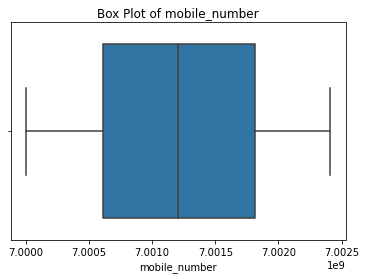

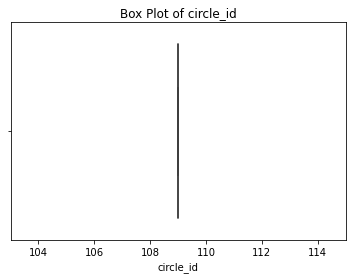

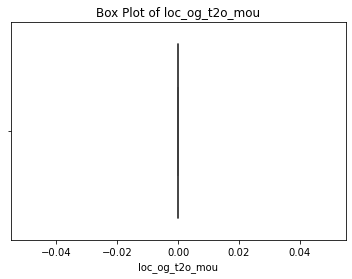

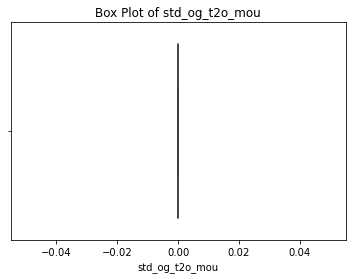

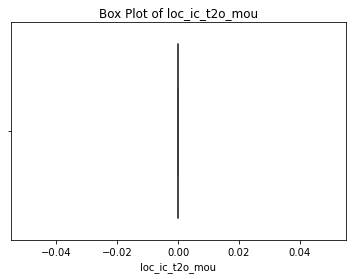

...

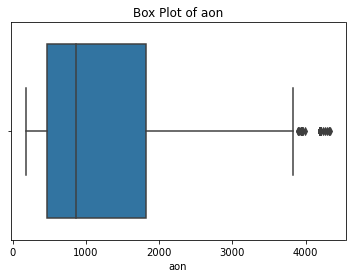

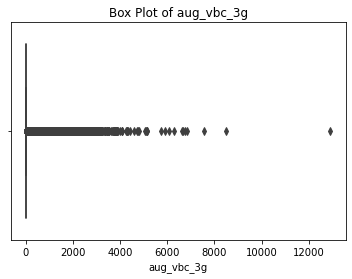

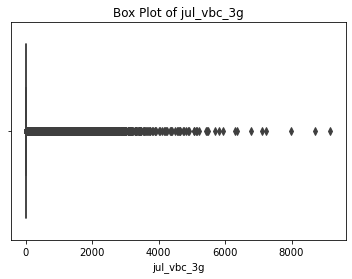

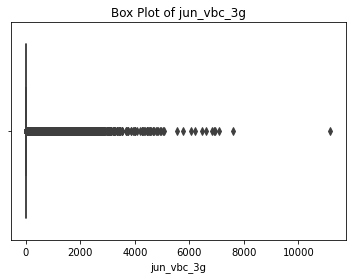

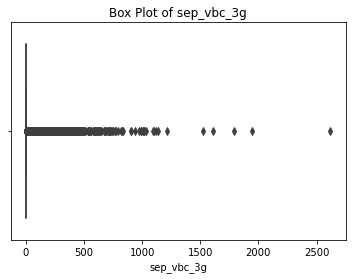

In [21]:
for i in col:
    sns.boxplot(tel_churn[i])
    plt.title('Box Plot of '+i)
    plt.show()

Observation: Almost all the variables are having outliers. We will be using Soft Capping, Hard Capping and IQR to treat the Outliers

In [22]:
tel_churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.871600e+04,98716.0,98716.0,98716.0,98716.0,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.0

In [23]:
# Drop the columns with single value.
single_value_columns=['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou',
                      'std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9',
                     'std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9']
tel_churn.drop(single_value_columns,axis=1,inplace=True)
tel_churn.shape

(98716, 166)

In [24]:
col=tel_churn.columns.drop(['mobile_number'])
col

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=165)

In [25]:
hard_cap_col=['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_ic_mou_9',
             'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_t2c_mou_9',
             'std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_t2f_mou_9',
             'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','isd_og_mou_9',
             'og_others_6','og_others_7','og_others_8','og_others_9',
             'std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_t2f_mou_9',
             'spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','spl_ic_mou_9',
             'isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','isd_ic_mou_9',
             'ic_others_6','ic_others_7','ic_others_8','ic_others_9',
             'vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_2g_mb_9',
             'vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','vol_3g_mb_9',
             'aug_vbc_3g','jul_vbc_3g','jun_vbc_3g','sep_vbc_3g']

In [26]:
soft_cap_col=['monthly_2g_6','monthly_2g_7','monthly_2g_8','monthly_2g_9','sachet_2g_6','sachet_2g_7','sachet_2g_8','sachet_2g_9',
             'monthly_3g_6','monthly_3g_7','monthly_3g_8','monthly_3g_9','sachet_3g_6','sachet_3g_7','sachet_3g_8','sachet_3g_9',
             'aon',]
soft_cap_col

['monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'monthly_2g_9',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'sachet_2g_9',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'monthly_3g_9',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'sachet_3g_9',
 'aon']

In [27]:
IQR_col=col.drop(soft_cap_col)
IQR_col=IQR_col.drop(hard_cap_col)
IQR_col

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8', 'offnet_mou_9', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_mou_6', 'loc_og_mou_7',
       'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_og_mou_9',
       'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'spl_og_mou_9',
       'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'total_og_mou_9',
      

In [28]:
#Replace all the outliers in IQR_col with whisker values
for i in IQR_col:
    q1=tel_churn[i].quantile(0.25)
    q3=tel_churn[i].quantile(0.75)
    IQR=q3-q1
    lower=q1-1.5*IQR
    upper=q3+1.5*IQR
    tel_churn[i][tel_churn[i]<lower]=lower
    tel_churn[i][tel_churn[i]>upper]=upper
    

In [29]:
#apply soft capping on soft cap columns
for i in soft_cap_col:
    q1=tel_churn[i].quantile(0.01)
    q2=tel_churn[i].quantile(0.99)
    tel_churn[i][tel_churn[i]<q1]=q1
    tel_churn[i][tel_churn[i]>q2]=q2

In [30]:
#apply hard capping on hard cap columns
for i in hard_cap_col:
    q1=tel_churn[i].quantile(0.05)
    q2=tel_churn[i].quantile(0.95)
    tel_churn[i][tel_churn[i]<q1]=q1
    tel_churn[i][tel_churn[i]>q2]=q2

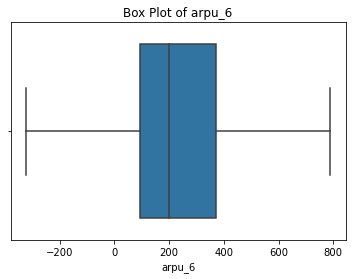

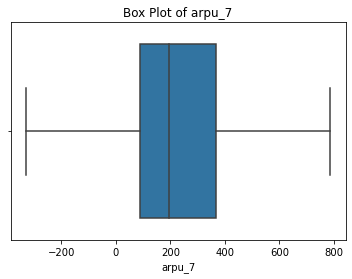

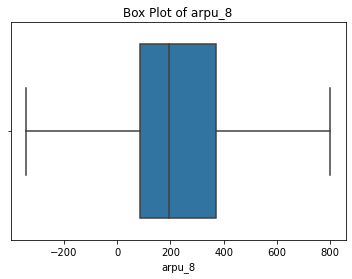

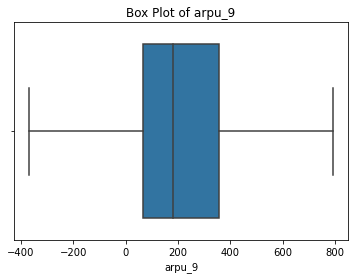

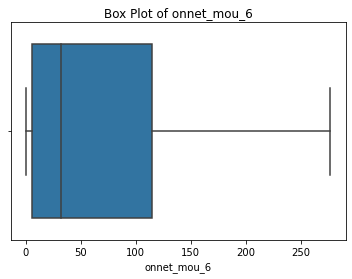

...

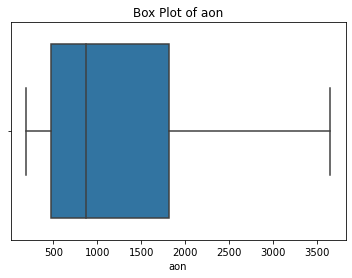

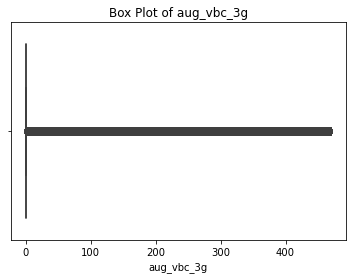

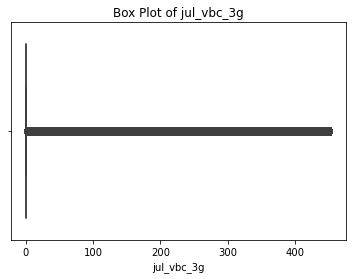

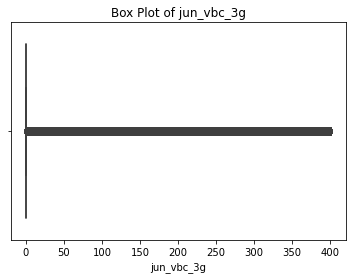

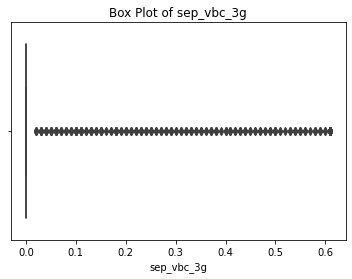

In [31]:
for i in col:
    sns.boxplot(tel_churn[i])
    plt.title('Box Plot of '+i)
    plt.show()

Observation: Outliers are removed for almost all the variables after the treatment

In [32]:
tel_churn.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.871600e+04,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.00000,94620.000000,92254.00000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.0,94620.0,92254.0,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,

In [33]:
# Drop Columns with only 0s after outlier treatment
zero_col=['roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','roam_og_mou_9',
         'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','isd_og_mou_9',
         'og_others_7','og_others_8','og_others_9']
tel_churn.drop(zero_col,axis=1,inplace=True)
tel_churn.shape

(98716, 155)

In [34]:
tel_churn.isna().sum().sort_values(ascending=False).head(60)

loc_ic_mou_9        6462
std_ic_t2f_mou_9    6462
loc_og_mou_9        6462
ic_others_9         6462
loc_og_t2c_mou_9    6462
std_og_t2m_mou_9    6462
isd_ic_mou_9        6462
loc_og_t2f_mou_9    6462
spl_ic_mou_9        6462
loc_og_t2m_mou_9    6462
std_og_t2f_mou_9    6462
std_og_mou_9        6462
loc_og_t2t_mou_9    6462
std_ic_mou_9        6462
roam_ic_mou_9       6462
std_og_t2t_mou_9    6462
loc_ic_t2m_mou_9    6462
offnet_mou_9        6462
std_ic_t2m_mou_9    6462
loc_ic_t2t_mou_9    6462
std_ic_t2t_mou_9    6462
onnet_mou_9         6462
spl_og_mou_9        6462
loc_ic_t2f_mou_9    6462
std_ic_t2f_mou_8    4096
isd_ic_mou_8        4096
std_og_t2m_mou_8    4096
ic_others_8         4096
loc_ic_t2f_mou_8    4096
loc_ic_t2t_mou_8    4096
std_ic_t2t_mou_8    4096
loc_ic_mou_8        4096
std_og_t2f_mou_8    4096
spl_ic_mou_8        4096
std_og_mou_8        4096
std_ic_t2m_mou_8    4096
std_og_t2t_mou_8    4096
spl_og_mou_8        4096
std_ic_mou_8        4096
loc_ic_t2m_mou_8    4096


In [35]:
#Impute remaining missing values with mean or median
simple_impute_col=tel_churn.columns[tel_churn.isna().sum()>0]
simple_impute_col

Index(['onnet_mou_8', 'onnet_mou_9', 'offnet_mou_8', 'offnet_mou_9',
       'roam_ic_mou_8', 'roam_ic_mou_9', 'loc_og_t2t_mou_8',
       'loc_og_t2t_mou_9', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_8',
       'loc_og_t2c_mou_9', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_8',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_8', 'std_og_t2f_mou_9', 'std_og_mou_8', 'std_og_mou_9',
       'spl_og_mou_8', 'spl_og_mou_9', 'loc_ic_t2t_mou_8', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_8', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_8',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_8', 'loc_ic_mou_9', 'std_ic_t2t_mou_8',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_8', 'std_ic_t2m_mou_9',
       'std_ic_t2f_mou_8', 'std_ic_t2f_mou_9', 'std_ic_mou_8', 'std_ic_mou_9',
       'spl_ic_mou_8', 'spl_ic_mou_9', 'isd_ic_mou_8', 'isd_ic_mou_9',
       'ic_others_8', 'ic_others_9'],
      dtype='object')

In [36]:
tel_churn[simple_impute_col].median()

onnet_mou_8         32.36
onnet_mou_9         29.84
offnet_mou_8        92.14
offnet_mou_9        87.29
roam_ic_mou_8        0.00
roam_ic_mou_9        0.00
loc_og_t2t_mou_8    11.73
loc_og_t2t_mou_9    11.26
loc_og_t2m_mou_8    40.36
loc_og_t2m_mou_9    39.12
loc_og_t2f_mou_8     0.00
loc_og_t2f_mou_9     0.00
loc_og_t2c_mou_8     0.00
loc_og_t2c_mou_9     0.00
loc_og_mou_8        63.73
loc_og_mou_9        61.84
std_og_t2t_mou_8     0.00
std_og_t2t_mou_9     0.00
std_og_t2m_mou_8     3.31
std_og_t2m_mou_9     2.50
std_og_t2f_mou_8     0.00
std_og_t2f_mou_9     0.00
std_og_mou_8        10.41
std_og_mou_9         8.41
spl_og_mou_8         0.00
spl_og_mou_9         0.00
loc_ic_t2t_mou_8    16.03
loc_ic_t2t_mou_9    15.66
loc_ic_t2m_mou_8    58.24
loc_ic_t2m_mou_9    56.61
loc_ic_t2f_mou_8     0.93
loc_ic_t2f_mou_9     0.96
loc_ic_mou_8        93.83
loc_ic_mou_9        91.64
std_ic_t2t_mou_8     0.00
std_ic_t2t_mou_9     0.00
std_ic_t2m_mou_8     2.03
std_ic_t2m_mou_9     1.74
std_ic_t2f_m

Note: Lets impute remaining missing values with median as almost all columns are highly skewed towards right

In [37]:
for i in simple_impute_col:
    Median=tel_churn[i].median()
    tel_churn[i].fillna(Median,inplace=True)

In [38]:
tel_churn.isna().sum().sort_values(ascending=False)

sep_vbc_3g            0
std_og_t2f_mou_9      0
spl_og_mou_8          0
spl_og_mou_7          0
spl_og_mou_6          0
std_og_mou_9          0
std_og_mou_8          0
std_og_mou_7          0
std_og_mou_6          0
std_og_t2f_mou_8      0
std_og_t2t_mou_7      0
std_og_t2f_mou_7      0
std_og_t2f_mou_6      0
std_og_t2m_mou_9      0
std_og_t2m_mou_8      0
std_og_t2m_mou_7      0
std_og_t2m_mou_6      0
std_og_t2t_mou_9      0
spl_og_mou_9          0
og_others_6           0
total_og_mou_6        0
total_og_mou_7        0
loc_ic_mou_6          0
loc_ic_t2f_mou_9      0
loc_ic_t2f_mou_8      0
loc_ic_t2f_mou_7      0
loc_ic_t2f_mou_6      0
loc_ic_t2m_mou_9      0
loc_ic_t2m_mou_8      0
loc_ic_t2m_mou_7      0
loc_ic_t2m_mou_6      0
loc_ic_t2t_mou_9      0
loc_ic_t2t_mou_8      0
loc_ic_t2t_mou_7      0
loc_ic_t2t_mou_6      0
total_og_mou_9        0
total_og_mou_8        0
std_og_t2t_mou_8      0
std_og_t2t_mou_6      0
loc_ic_mou_8          0
offnet_mou_6          0
roam_ic_mou_9   

Observation: All the missing values are treated and no missing values are left

#### Step 3: Filtering High Value Customers using 6th and 7th month data (good phase)

In [39]:
# create new column for average recharge of 6th and 7th month
tel_churn['Avg_rech_amt_6+7']=(tel_churn['total_rech_amt_6']+tel_churn['total_rech_amt_7'])/2
perc_70=tel_churn['Avg_rech_amt_6+7'].quantile(0.70)
perc_70

371.0

In [40]:
#filter High Value Customers based on 70th percentile of 'Avg_rech_amt_6+7'
HVC=tel_churn[(tel_churn['Avg_rech_amt_6+7'])>=perc_70]
HVC
HVC.shape

(29643, 156)

In [41]:
HVC=HVC.reset_index(drop=True)

In [42]:
HVC.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Avg_rech_amt_6+7
0,7000701601,788.840,786.4325,799.778,500.000,57.8400,54.68,52.29,29.84,453.43,508.67125,325.91,87.29,16.23,21.995,24.461,0.00,51.39,31.380,40.28,11.26,255.63,249.33625,162.28,39.12,4.775,4.90,5.1,0.00,0.0,0.0,0.00,0.0,388.535,377.8675,255.79,61.84,4.30,23.29,12.01,0.000,49.89000,31.76,49.140,2.50,4.16,3.8,3.95,0.00,60.8600,75.14,77.8400,8.4100,4.50,0.00,6.500,0.00,0.00,487.53000,609.24,350.160,0.00,58.14,32.26,27.31,15.66,217.56,221.49,121.19,56.61,19.20,19.65,20.275,0.96,427.88,355.23,188.04,91.64,9.325,9.825,10.20,0.000,35.60,37.65,38.40,1.74,8.16,8.29,8.53,0.0,64.60,67.95,69.26,5.380,573.535,558.04,428.74000,0.00,0.21,0.0,0.0,0.0,2.060,14.5300,29.91,0.0000,2.0,2.5425,2.45,0.00,5,5,7,3,935,790,948,0.0,255,275,315,0,0,0,325,0,0.0,0.0000,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,862.5
1,7001524846,378.721,492.2230,137.362,166.787,276.7475,269.29,35.08,33.46,94.66,80.63000,136.48,108.71,0.00,0.000,0.000,0.00,96.69,94.505,12.49,26.13,80.96,70.58000,50.54,34.58,0.000,0.00,0.0,0.00,0.0,0.0,7.15,0.0,378.090,288.1800,63.04,60.71,69.65,70.90,22.58,7.330,13.69000,10.04,75.690,74.13,0.00,0.0,0.00,0.00,130.2600,143.48,98.2800,81.4600,0.00,0.00,9.975,0.00,0.00,508.36000,431.66,171.560,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.000,0.00,81.43,23.83,15.79,21.38,0.000,0.580,0.10,0.000,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66,0.75,13.530,103.860,28.49,16.54000,34.91,0.00,0.0,0.0,0.0,0.000,0.0000,0.00,0.0000,0.0,0.0000,0.00,0.00,18,19,14,15,437,601,120,186.0,90,154,30,36,50,0,10,0,0.0,323.6825,0.03,0.0,0.0,750.95,11.94,0.0,0,1,0,0,0,1,3,0,0,0,0,0,0,0,0,0,315,21.03,452.80,122.16,0.0,519.0
2,7002191713,492.846,205.6710,593.260,322.732,276.7475,108.39,279

In [43]:
#drop 'Avg_rech_amt_6+7' column from new dataset
HVC.drop('Avg_rech_amt_6+7',axis=1,inplace=True)
HVC.shape

(29643, 155)

Observation: There are 29643 customers conisdered as High Value Customers

#### Step 4: Derive Churn using 9th month data (churn pahase)

In [44]:
# 1 indicated Churned and 0 indicates not churned
HVC['Churn']=0
HVC['Churn'][(HVC['total_ic_mou_9']==0) & (HVC['total_og_mou_9']==0) & (HVC['vol_2g_mb_9']==0) & (HVC['vol_3g_mb_9']==0)]=1
HVC.Churn

0        1
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       1
24       0
25       0
26       0
27       0
28       1
29       0
30       0
31       0
32       0
33       0
34       0
35       1
36       0
37       0
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       0
48       0
49       0
50       0
51       1
52       0
53       0
54       1
55       0
56       0
57       0
58       0
59       0
60       0
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0
90       0

In [45]:
HVC.Churn.value_counts()

0    27133
1     2510
Name: Churn, dtype: int64

Observation: The non churn customers are turned out to be 27133 and churned would be 2510. So here there is a heavy class imbalance

#### Step 5: Drop 9th month data (churn pahase)

In [46]:
col=HVC.columns

In [47]:
for i in col:
    name=i.split('_')
    if name[-1]=='9':
        HVC.drop(i,axis=1,inplace=True)

In [48]:
HVC.shape

(29643, 119)

In [49]:
HVC.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churn
0,7000701601,788.840,786.4325,799.778,57.8400,54.68,52.29,453.43,508.67125,325.91,16.23,21.995,24.461,51.39,31.380,40.28,255.63,249.33625,162.28,4.775,4.90,5.1,0.0,0.0,0.00,388.535,377.8675,255.79,4.30,23.29,12.01,49.89000,31.76,49.140,4.16,3.8,3.95,60.8600,75.14,77.8400,4.50,0.00,6.500,0.00,487.53000,609.24,350.160,58.14,32.26,27.31,217.56,221.49,121.19,19.20,19.65,20.275,427.88,355.23,188.04,9.325,9.825,10.20,35.60,37.65,38.40,8.16,8.29,8.53,64.60,67.95,69.26,573.535,558.04,428.74000,0.21,0.0,0.0,2.060,14.5300,29.91,2.0,2.5425,2.45,5,5,7,935,790,948,255,275,315,0,0,325,0.0,0.0000,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1
1,7001524846,378.721,492.2230,137.362,276.7475,269.29,35.08,94.66,80.63000,136.48,0.00,0.000,0.000,96.69,94.505,12.49,80.96,70.58000,50.54,0.000,0.00,0.0,0.0,0.0,7.15,378.090,288.1800,63.04,69.65,70.90,22.58,13.69000,10.04,75.690,0.00,0.0,0.00,130.2600,143.48,98.2800,0.00,0.00,9.975,0.00,508.36000,431.66,171.560,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.000,81.43,23.83,15.79,0.000,0.580,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.860,28.49,16.54000,0.00,0.0,0.0,0.000,0.0000,0.00,0.0,0.0000,0.00,18,19,14,437,601,120,90,154,30,50,0,10,0.0,323.6825,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,452.80,122.16,0.0,0
2,7002191713,492.846,205.6710,593.260,276.7475,108.39,279.96,413.31,119.28000,482.46,23.53,21.995,24.461,49.63,6.190,36.01,151.13,47.28000,258.01,4.540,0.00,5.1,0.0,0.0,0.49,205.310,53.4800,353.99,69.65,70.90,76.45,124.70625,52.94,131.225,0.00,0.0,0.00,338.7875,138.93,369.8625,0.00,0.00,4.780,0.00,872.77125,192.41,875.585,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.490,215.58,26.11,255.26,9.325,9.825,10.20,35.60,29.79,38.40,0.00,0.00,1.91,64.60,67.95,69.26,573.535,172.58,567.69375,0.41,0.0,0.0,23.835,27.8325,29.91,2.0,2.5425,2.45,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0000,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0.0,0
3,7000875565,430.975,299.8690,187.894,50.5100,74.01,70.61,296.29,229.74000,162.76,0.00,2.830,0.000,42.61,65.160,67.38,255.63,145.99000,128.28,0.000,4.48,5.1,0.0,0.0,0.00,315.910,215.6400,205.93,7.89,2.58,3.23,22.99000,64.51,18.290,0.00,0.0,0.00,30.8900,67.09,21.5300,0.00,3.26,5.910,0.00,346.81000,286.01,233.380,41.33,71.44,28.

#### Step 6: Data Preparation (Deriving Variables, EDA, Handling class imbalance, Splitting the data into Train and Test, Scaling)

##### Deriving new variables

Note: We have selected the variables such as 'Recharge Amount', 'Data Volume based on usage of 2G and 3G' for derving the information pertaining Good Phase and Action Phase as these variables will be impacting the churn rate pretty much

In [50]:
HVC['Total_rech_amt_GoodPhase']=HVC['total_rech_amt_6']+HVC['total_rech_amt_7']
HVC['Total_data_volume_GoodPhase']=HVC['vol_2g_mb_6']+HVC['vol_2g_mb_7']+HVC['vol_3g_mb_6']+HVC['vol_3g_mb_7']
HVC['Total_data_volume_ActionPhase']=HVC['vol_2g_mb_8']+HVC['vol_3g_mb_8']
HVC.rename(columns={'total_rech_amt_8':'Total_rech_amt_ActionPhase'},inplace=True)
HVC.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,Total_rech_amt_ActionPhase,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churn,Total_rech_amt_GoodPhase,Total_data_volume_GoodPhase,Total_data_volume_ActionPhase
0,7000701601,788.840,786.4325,799.778,57.8400,54.68,52.29,453.43,508.67125,325.91,16.23,21.995,24.461,51.39,31.380,40.28,255.63,249.33625,162.28,4.775,4.90,5.1,0.0,0.0,0.00,388.535,377.8675,255.79,4.30,23.29,12.01,49.89000,31.76,49.140,4.16,3.8,3.95,60.8600,75.14,77.8400,4.50,0.00,6.500,0.00,487.53000,609.24,350.160,58.14,32.26,27.31,217.56,221.49,121.19,19.20,19.65,20.275,427.88,355.23,188.04,9.325,9.825,10.20,35.60,37.65,38.40,8.16,8.29,8.53,64.60,67.95,69.26,573.535,558.04,428.74000,0.21,0.0,0.0,2.060,14.5300,29.91,2.0,2.5425,2.45,5,5,7,935,790,948,255,275,315,0,0,325,0.0,0.0000,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1,1725,0.0000,0.00
1,7001524846,378.721,492.2230,137.362,276.7475,269.29,35.08,94.66,80.63000,136.48,0.00,0.000,0.000,96.69,94.505,12.49,80.96,70.58000,50.54,0.000,0.00,0.0,0.0,0.0,7.15,378.090,288.1800,63.04,69.65,70.90,22.58,13.69000,10.04,75.690,0.00,0.0,0.00,130.2600,143.48,98.2800,0.00,0.00,9.975,0.00,508.36000,431.66,171.560,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.000,81.43,23.83,15.79,0.000,0.580,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.860,28.49,16.54000,0.00,0.0,0.0,0.000,0.0000,0.00,0.0,0.0000,0.00,18,19,14,437,601,120,90,154,30,50,0,10,0.0,323.6825,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,452.80,122.16,0.0,0,1038,1074.6325,11.97
2,7002191713,492.846,205.6710,593.260,276.7475,108.39,279.96,413.31,119.28000,482.46,23.53,21.995,24.461,49.63,6.190,36.01,151.13,47.28000,258.01,4.540,0.00,5.1,0.0,0.0,0.49,205.310,53.4800,353.99,69.65,70.90,76.45,124.70625,52.94,131.225,0.00,0.0,0.00,338.7875,138.93,369.8625,0.00,0.00,4.780,0.00,872.77125,192.41,875.585,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.490,215.58,26.11,255.26,9.325,9.825,10.20,35.60,29.79,38.40,0.00,0.00,1.91,64.60,67.95,69.26,573.535,172.58,567.69375,0.41,0.0,0.0,23.835,27.8325,29.91,2.0,2.5425,2.45,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0000,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0.0,0,760,0.0000,0.02
3,7000875565,430.975,299.8690,187.894,50.5100,74.01,70.61,296.29,229.74000,162.76,0.00,2.830,0.000,42.61,65.160,67.38,255.63,145.99000,128.28,0.000,4.48,5.1,0.0,0.0,0.00,315.910,215

In [51]:
HVC.shape

(29643, 122)

Observation: There are 3 newly derived variables added along with the existing varaibles in the dataframe

##### EDA

In [52]:
#Drop mobile_number from HVC
HVC.drop('mobile_number',axis=1,inplace=True)

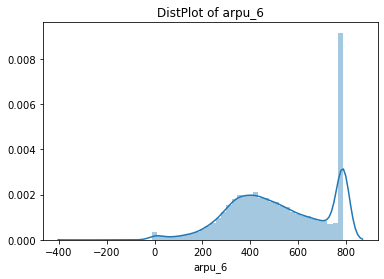

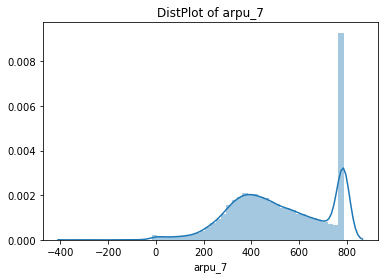

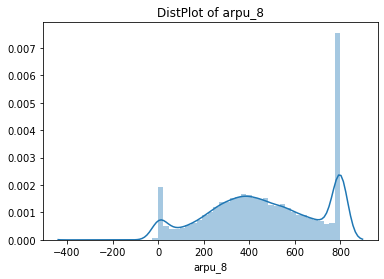

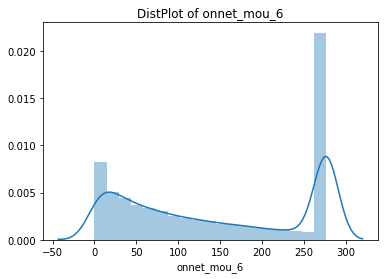

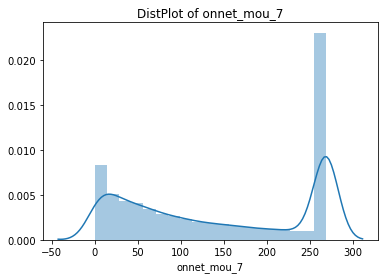

...

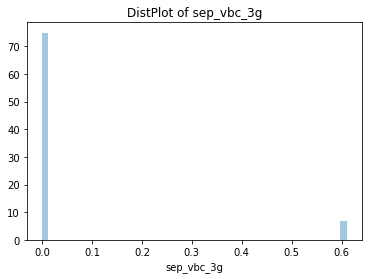

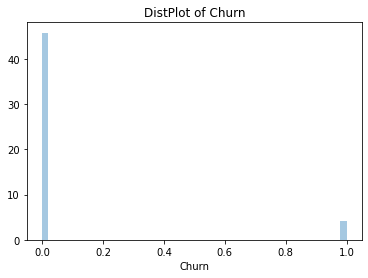

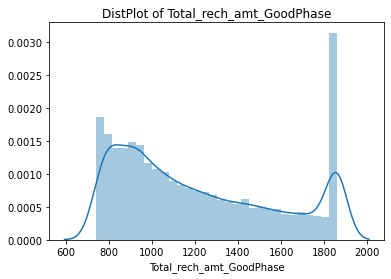

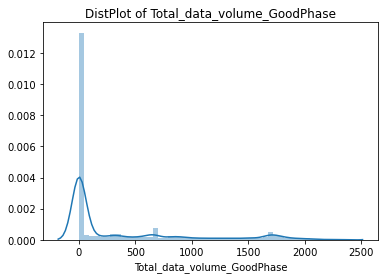

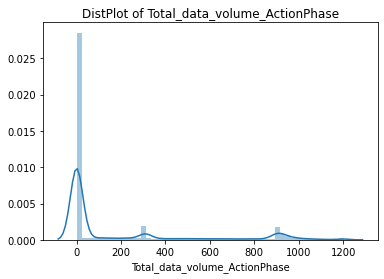

In [53]:
col=HVC.columns
for i in col:
    sns.distplot(HVC[i])
    plt.title('DistPlot of '+i)
    plt.show()

Observation: Most of the variables are right skewed and few of them are having multi nodes as of missing values imputation

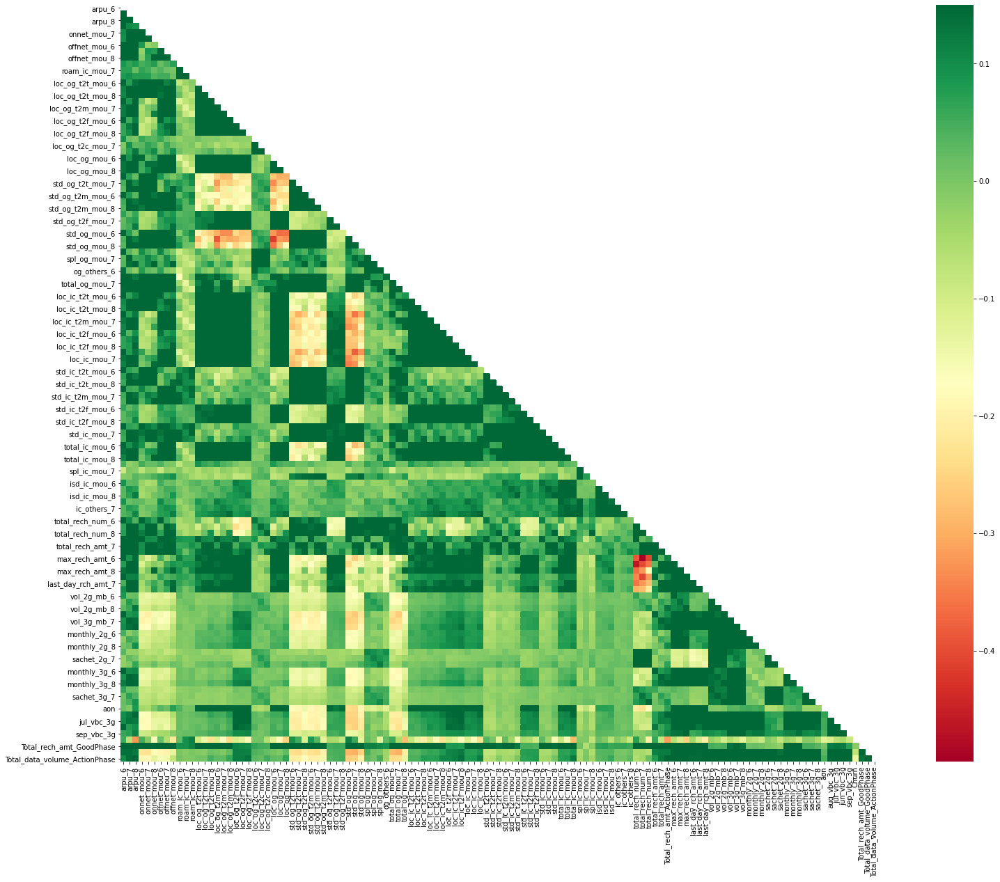

In [54]:
cor=HVC.corr()
mask = np.zeros_like(cor)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(30,20))
sns.heatmap(cor,cmap='RdYlGn', mask=mask, vmax=.15, square=True);

Observation: Most of the variables are highly correlated with each other based on the above heatmap, we are not dropping the highly correlated variables in this step itself rather we will be dealing those during the time of model building using feature extraction techniques and PCA

In [55]:
# Verifying the Churn Rate
churn_rate = round((sum(HVC['Churn'])/len(HVC['Churn'].index)) * 100, 0)
churn_rate

8.0

Observation: The Churn rate is turned out to be 8% here

##### Handling Class Imbalance

In [56]:
y=HVC['Churn']
X=HVC.drop('Churn',axis=1)

In [57]:
y.value_counts()

0    27133
1     2510
Name: Churn, dtype: int64

Observation: We can see that target y is imbalanced. Hence we will perform data balancing with oversampling

In [58]:
import imblearn
from imblearn.over_sampling import SMOTE

In [59]:
SM=SMOTE()
X_over,y_over=SM.fit_resample(X,y)

In [60]:
y_over.value_counts()

1    27133
0    27133
Name: Churn, dtype: int64

Observation: Here the class imbalance is treated and the churn values are equally distributed

In [61]:
y.head()

0    1
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

##### Test-Train Split

In [62]:
from sklearn.model_selection import train_test_split

In [63]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_over, y_over, train_size=0.7, test_size=0.3, random_state=100)

##### Feature Scaling

In [64]:
from sklearn.preprocessing import MinMaxScaler

In [65]:
scaler=MinMaxScaler()
X_train=pd.DataFrame(scaler.fit_transform(X_train),columns=X_over.columns)
X_test=pd.DataFrame(scaler.transform(X_test),columns=X_over.columns)

In [66]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,Total_rech_amt_ActionPhase,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Total_rech_amt_GoodPhase,Total_data_volume_GoodPhase,Total_data_volume_ActionPhase
0,0.599626,0.582239,0.477472,0.874479,0.786847,0.579833,0.201495,0.251262,0.081402,0.0,0.0,0.0,1.000000,1.000000,1.000000,0.407542,0.504098,0.153134,0.0,0.093878,0.0,0.0,0.000000,0.020305,0.891014,0.894652,0.518040,0.000000,0.000000,0.000000,0.00000,0.000000,0.013183,0.0,0.000000,0.000000,0.000000,0.000000,0.004677,0.000000,0.189112,0.134336,0.000000,0.396656,0.380911,0.234049,0.740474,0.376571,0.665599,0.368940,0.265103,0.444604,0.000000,0.005089,0.046856,0.410994,0.258693,0.449743,0.000000,0.000000,0.0,0.011517,0.000000,0.368229,0.000000,0.0000,0.000000,0.006347,0.000000,0.204158,0.335429,0.209396,0.396534,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.500000,0.526316,0.277778,0.427807,0.421622,0.242616,0.196078,0.400000,0.158730,0.181818,0.181818,0.092308,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.076545,0.0,0.000000,0.000000,0.0,0.042934,0.000000,0.000000
1,0.738840,0.573259,0.578675,1.000000,0.834714,0.884698,0.418694,0.464721,0.398677,0.0,0.0,0.0,0.028235,0.033120,0.011341,0.112115,0.041631,0.069803,0.0,0.057143,0.0,0.0,0.000000,0.000000,0.080791,0.036494,0.049099,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.583647,0.517114,0.521114,0.179945,0.126921,0.511020,0.036951,0.011526,0.016089,0.000000,0.000000,0.008878,0.066030,0.037049,0.131623,0.000000,0.043766,1.0,1.000000,1.000000,1.000000,0.000000,0.0000,0.000000,0.694118,0.715379,1.000000,0.131971,0.115557,0.352408,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.555556,0.421053,0.722222,0.627807,0.358919,0.496835,0.776471,0.400000,0.412698,0.160000,0.400000,0.400000,1.000000,0.000000,0.000000,0.597763,0.0,0.0,1.0,0.0,0.0,0.125,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.142981,0.0,0.152429,0.475808,0.0,0.158318,0.350061,0.000000
2,1.000000,1.000000,1.000000,0.111618,0.268447,0.617624,1.000000,1.000000,1.000000,0.0,0.0,0.0,0.000000,0.007936,0.050166,1.000000,1.000000,1.000000,1.0,1.000000,1.0,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,0.443503,1.000000,1.000000,0.11050,0.008103,0.052048,0.0,0.284211,1.000000,0.131882,0.208094,0.483585,0.000000,0.000000,0

In [67]:
X_train.shape

(37986, 120)

In [68]:
X_test.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,Total_rech_amt_ActionPhase,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Total_rech_amt_GoodPhase,Total_data_volume_GoodPhase,Total_data_volume_ActionPhase
0,0.730081,0.461932,0.629766,1.000000,0.286234,0.742820,0.229268,0.234945,0.331591,1.0,0.0,0.000000,1.000000,0.232157,0.178186,0.206666,0.289609,0.162939,0.000000,0.353061,0.417647,0.000000,0.785124,0.0,0.495399,0.253766,0.158179,1.000000,0.777574,1.0,0.102721,0.313580,0.985407,0.0,0.0,0.0,0.589632,0.268352,0.864727,0.127354,0.653295,0.04812,0.0,0.450244,0.220433,0.436211,1.000000,0.271813,0.602883,0.297071,0.449691,0.421271,1.000000,0.503308,1.000000,0.675777,0.374276,0.526491,1.0,1.000000,1.0,0.956742,1.000000,1.000000,0.000000,0.000000,0.000000,0.775697,1.000000,1.000000,0.679191,0.616344,0.700659,1.0,1.0,1.0,0.976715,1.000000,0.266132,0.00000,0.000000,1.000000,0.944444,0.473684,0.833333,0.583957,0.222703,0.453586,0.196078,0.181818,0.349206,0.109091,0.072727,0.061538,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.356730,0.0,0.0,0.000000,0.0,0.008945,0.000000,0.0
1,1.000000,0.410034,0.298890,0.004076,0.000000,0.115588,0.208850,0.001515,0.176107,0.0,0.0,0.000000,0.001536,0.000000,0.119847,0.143043,0.002646,0.156428,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.116077,0.001746,0.163569,0.000000,0.000000,0.0,0.000000,0.000000,0.025224,0.0,0.0,0.0,0.000000,0.000000,0.028146,0.000000,0.000000,0.00000,0.0,0.192476,0.000864,0.000000,0.002659,0.000000,0.144652,0.192708,0.000769,0.190060,0.188179,0.000000,0.045869,0.132214,0.000495,0.200035,0.0,0.000000,0.0,0.050609,0.000000,0.052865,0.000000,0.000000,0.000000,0.027890,0.000000,0.084897,0.349446,0.012317,0.000000,0.0,0.0,0.0,1.000000,0.133811,0.000000,0.07092,0.133811,0.000000,0.333333,0.210526,0.000000,1.000000,0.028108,0.000000,1.000000,0.094545,0.000000,1.000000,0.094545,0.000000,0.058382,0.0,0.0,0.126173,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052282,0.0,0.0,0.263143,0.0,0.195886,0.052225,0.0
2,0.821374,0.403716,0.299474,0.192522,0.111256,0.000000,1.000000,0.197790,0.000000,0.0,1.0,0.043334,0.038577,0.030051,0.000000,0.261159,0.035454,0.000000,0.000000,0.000000,0.000000,0.093548,0.000000,0.0,0.181425,0.030937,0.000000,0.711271,0.000000,0.0,1.000000,0.528351,0.000000,0.0,0.0,0.0,1.000000,0.189731,0.000000,0.104036,0.000000,0.00000,0.0,1.000000,0.088424,0.000000,0.121604,0.0636

In [69]:
y_train.head()

24350    0
26338    0
25255    0
20456    0
1589     0
Name: Churn, dtype: int64

In [70]:
y_test.head()

11342    0
52716    1
274      1
10233    0
25059    0
Name: Churn, dtype: int64

In [71]:
y_train=y_train.reset_index(drop=True)
y_train.head()

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

In [72]:
y_test=y_test.reset_index(drop=True)
y_test.head()

0    0
1    1
2    1
3    0
4    0
Name: Churn, dtype: int64

#### Step 7: Model Building (Building 1 Interpretable Model without PCA and 3 High Performance Model with PCA)

##### Building 1 Interpretable Model without PCA

In [73]:
import statsmodels.api as sm

# Running First Training Model i.e Logistic regression model (Interpretabel model)
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37867
Model Family:                Binomial   Df Model:                          118
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        23:22:54   Pearson chi2:                 4.41e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                          2.171e+18   7.43e+08   2.92e+09      0.000    2.17e+18    2.17e+18
arpu_6                         7.082e+14   5.71e+06   1.24e+08      0.000    7.08e+14    7.08e+14
arpu_7                         1.378e+15    5.7e+06   2.42e+08      0.000    1.38e+15    1.38e+15
arpu_8                         2.505e+13   5.96e+06    4.2e+06      0.000    2.51e+13    2.51e+13
onnet_mou_6                    5.804e+13   2.35e+06   2.47e+07      0.000     5.8e+13     5.8e+13
onnet_mou_7                   -1.908e+14   2.62e+06  -7.27e+07      0.000   -1.91e+14   -1.91e+14
onnet_mou_8                    1.139e+14   2.68e+06   4.25e+07      0.000    1.14e+14    1.14e+14
offnet_mou_6                   7.843e+13   2.64e+06   2.97e+07      0.000    7.84e+13    7.84e+13
offnet_mou_7                  -5.987e+13    2.9e+06  -2.07e+07      0.000   -5.99e+13   -5.99e+13
offnet_mou_8                  -4.228e+14   2.92e+06  -1.45e+08      0.000   -4.23e+14   -4.23e+14
roam_ic_mou_6                  2.848e+13   1.53e+06   1.86e+07      0.000    2.85e+13    2.85e+13
roam_ic_mou_7                 -7.738e+12   1.49e+06   -5.2e+06      0.000   -7.74e+12   -7.74e+12
roam_ic_mou_8                  5.749e+14   1.46e+06   3.94e+08      0.000    5.75e+14    5.75e+14
loc_og_t2t_mou_6               2.077e+14   2.69e+06   7.71e+07      0.000    2.08e+14    2.08e+14
loc_og_t2t_mou_7               1.619e+14   2.84e+06    5.7e+07      0.000    1.62e+14    1.62e+14
loc_og_t2t_mou_8              -2.095e+14   3.05e+06  -6.87e+07      0.000   -2.09e+14   -2.09e+14
loc_og_t2m_mou_6              -5.506e+13   4.38e+06  -1.26e+07      0.000   -5.51e+13   -5.51e+13
loc_og_t2m_mou_7               3.866e+14   4.94e+06   7.83e+07      0.000    3.87e+14    3.87e+14
loc_og_t2m_mou_8               4.538e+13   5.13e+06   8.85e+06      0.000    4.54e+13    4.54e+13
loc_og_t2f_mou_6              -4.657e+13   1.37e+06  -3.39e+07      0.000   -4.66e+13   -4.66e+13
loc_og_t2f_mou_7              -1.544e+13   1.43e+06  -1.08e+07      0.000   -1.54e+13   -1.54e+13
loc_og_t2f_mou_8               1.011e+14   1.52e+06   6.66e+07      0.000    1.01e+14    1.01e+14
loc_og_t2c_mou_6              -1.743e+14   1.56e+06  -1.12e+08      0.000   -1.74e+14   -1.74e+14
loc_og_t2c_mou_7               2.608e+13   1.59e+06   1.64e+07      0.000    2.61e+13    2.61e+13
loc_og_t2c_mou_8               2.659e+14   1.85e+06   1.44e+08      0.000    2.66e+14    2.66e+14
loc_og_mou_6                  -2.015e+14   5.32e+06  -3.79e+07      0.000   -2.01e+14   -2.01e+14
loc_og_mou_7                  -8.259e+14   5.99e+06  -1.38e+08      0.000   -8.26e+14   -8.26e+14
loc_og_mou_8                   5.012e+14   6.29e+06   7.97e+07      0.000    5.01e+14    5.01e+14
std_og_t2t_mou_6              -8.602e+13   2.

### Feature selection using RFE

In [74]:
# running RFE with 25 variables as output
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
logreg = LogisticRegression()
rfe = RFE(logreg, 25)             
rfe = rfe.fit(X_train, y_train)

In [75]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 29),
 ('arpu_7', True, 1),
 ('arpu_8', False, 9),
 ('onnet_mou_6', False, 61),
 ('onnet_mou_7', False, 94),
 ('onnet_mou_8', False, 46),
 ('offnet_mou_6', False, 84),
 ('offnet_mou_7', False, 52),
 ('offnet_mou_8', False, 32),
 ('roam_ic_mou_6', False, 70),
 ('roam_ic_mou_7', False, 55),
 ('roam_ic_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 62),
 ('loc_og_t2t_mou_7', False, 51),
 ('loc_og_t2t_mou_8', False, 18),
 ('loc_og_t2m_mou_6', False, 58),
 ('loc_og_t2m_mou_7', False, 64),
 ('loc_og_t2m_mou_8', False, 19),
 ('loc_og_t2f_mou_6', False, 38),
 ('loc_og_t2f_mou_7', False, 67),
 ('loc_og_t2f_mou_8', False, 12),
 ('loc_og_t2c_mou_6', False, 59),
 ('loc_og_t2c_mou_7', False, 85),
 ('loc_og_t2c_mou_8', False, 49),
 ('loc_og_mou_6', False, 63),
 ('loc_og_mou_7', True, 1),
 ('loc_og_mou_8', False, 17),
 ('std_og_t2t_mou_6', False, 73),
 ('std_og_t2t_mou_7', False, 15),
 ('std_og_t2t_mou_8', False, 14),
 ('std_og_t2m_mou_6', False, 92),
 ('std_og_t2m_mou_7', False, 79

In [76]:
col = X_train.columns[rfe.support_]

In [77]:
X_train.columns[~rfe.support_]

Index(['arpu_6', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6',
       'roam_ic_mou_7', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8',
       'og_others_6', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_6',
       'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6',
       'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6',
       'loc_ic_t

##### Checking p-value and VIF

In [78]:
# Rebuilding the model after completing coarse tuning (RFE):
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37960
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12526.
Date:                Mon, 31 May 2021   Deviance:                       25052.
Time:                        23:25:47   Pearson chi2:                 1.13e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.4434      0.074      6.010      0.000       0.299       0.588
arpu_7                          3.2035      0.117     27.431      0.000       2.975       3.432
roam_ic_mou_8                   1.4526      0.054     26.890      0.000       1.347       1.559
loc_og_mou_7                   -1.1454      0.071    -16.239      0.000      -1.284      -1.007
total_og_mou_8                 -1.3376      0.064    -20.782      0.000      -1.464      -1.211
loc_ic_mou_6                   -1.6257      0.177     -9.188      0.000      -1.972      -1.279
loc_ic_mou_8                    2.3238      0.194     11.996      0.000       1.944       2.703
total_ic_mou_6                  2.4028      0.175     13.768      0.000       2.061       2.745
total_ic_mou_7                  0.8840      0.120      7.349      0.000       0.648       1.120
total_ic_mou_8                 -5.2868      0.196    -26.927      0.000      -5.672      -4.902
spl_ic_mou_8                   -1.9701      0.117    -16.839      0.000      -2.199      -1.741
total_rech_num_8               -1.7617      0.075    -23.637      0.000      -1.908      -1.616
last_day_rch_amt_8             -3.0951      0.088    -35.106      0.000      -3.268      -2.922
monthly_2g_6                   -2.2794      0.121    -18.907      0.000      -2.516      -2.043
monthly_2g_7                   -1.8364      0.117    -15.657      0.000      -2.066      -1.607
monthly_2g_8                   -2.6667      0.175    -15.252      0.000      -3.009      -2.324
sachet_2g_6                    -1.0539      0.145     -7.280      0.000      -1.338      -0.770
sachet_2g_8                    -2.3869      0.166    -14.389      0.000      -2.712      -2.062
monthly_3g_6                   -2.3147      0.161    -14.383      0.000      -2.630      -1.999
monthly_3g_7                   -2.0620      0.171    -12.047      0.000      -2.397      -1.727
monthly_3g_8                   -4.1695      0.218    -19.097      0.000      -4.597      -3.742
sachet_3g_6                    -2.1258      0.167    -12.702      0.000      -2.454      -1.798
sachet_3g_8                    -2.3718      0.221    -10.749      0.000      -2.804      -1.939
aon                            -1.3422      0.070    -19.073      0.000      -1.480      -1.204
sep_vbc_3g                     -3.2459      0.177    -18.320      0.000      -3.593      -2.899
Total_data_volume_GoodPhase     4.4727      0.174     25.721      0.000       4.132       4.813
===============================================================================================
"""

##### Checking VIFs

In [79]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def checkVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [80]:
checkVIF(X_train_sm)

,Features,VIF
0,const,20.87
9,total_ic_mou_8,11.00
5,loc_ic_mou_6,9.72
6,loc_ic_mou_8,9.55
7,total_ic_mou_6,8.92
8,total_ic_mou_7,4.80
25,Total_data_volume_GoodPhase,3.33
4,total_og_mou_8,2.62
3,loc_og_mou_7,2.62
19,monthly_3g_7,2.45


In [81]:
# dropping column 'total_ic_mou_8' which has high VIF (>5)

col = col.drop('total_ic_mou_8', 1)

In [82]:
col

Index(['arpu_7', 'roam_ic_mou_8', 'loc_og_mou_7', 'total_og_mou_8',
       'loc_ic_mou_6', 'loc_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7',
       'spl_ic_mou_8', 'total_rech_num_8', 'last_day_rch_amt_8',
       'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6',
       'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
       'sachet_3g_6', 'sachet_3g_8', 'aon', 'sep_vbc_3g',
       'Total_data_volume_GoodPhase'],
      dtype='object')

In [83]:
# Rebuilding the modelbased on manual tuning (p-values and VIF):
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37961
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12955.
Date:                Mon, 31 May 2021   Deviance:                       25909.
Time:                        23:25:49   Pearson chi2:                 1.48e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.8231      0.070     11.715      0.000       0.685       0.961
arpu_7                          3.3269      0.114     29.111      0.000       3.103       3.551
roam_ic_mou_8                   1.2866      0.053     24.218      0.000       1.183       1.391
loc_og_mou_7                   -0.9654      0.069    -14.019      0.000      -1.100      -0.830
total_og_mou_8                 -1.7774      0.062    -28.706      0.000      -1.899      -1.656
loc_ic_mou_6                    0.4308      0.146      2.946      0.003       0.144       0.717
loc_ic_mou_8                   -1.9654      0.104    -18.891      0.000      -2.169      -1.761
total_ic_mou_6                  0.7242      0.146      4.967      0.000       0.438       1.010
total_ic_mou_7                 -0.4374      0.104     -4.190      0.000      -0.642      -0.233
spl_ic_mou_8                   -2.1703      0.118    -18.327      0.000      -2.402      -1.938
total_rech_num_8               -2.0366      0.073    -27.846      0.000      -2.180      -1.893
last_day_rch_amt_8             -3.4213      0.086    -39.622      0.000      -3.591      -3.252
monthly_2g_6                   -2.2463      0.116    -19.342      0.000      -2.474      -2.019
monthly_2g_7                   -1.9090      0.115    -16.616      0.000      -2.134      -1.684
monthly_2g_8                   -2.6971      0.173    -15.626      0.000      -3.035      -2.359
sachet_2g_6                    -1.1215      0.143     -7.865      0.000      -1.401      -0.842
sachet_2g_8                    -2.4678      0.166    -14.906      0.000      -2.792      -2.143
monthly_3g_6                   -2.1499      0.155    -13.869      0.000      -2.454      -1.846
monthly_3g_7                   -2.4025      0.169    -14.205      0.000      -2.734      -2.071
monthly_3g_8                   -4.1847      0.217    -19.263      0.000      -4.611      -3.759
sachet_3g_6                    -2.0676      0.162    -12.737      0.000      -2.386      -1.749
sachet_3g_8                    -2.5413      0.222    -11.459      0.000      -2.976      -2.107
aon                            -1.4070      0.068    -20.566      0.000      -1.541      -1.273
sep_vbc_3g                     -3.2583      0.173    -18.878      0.000      -3.597      -2.920
Total_data_volume_GoodPhase     4.4402      0.172     25.832      0.000       4.103       4.777
===============================================================================================
"""

In [84]:
checkVIF(X_train_sm)

,Features,VIF
0,const,20.34
5,loc_ic_mou_6,8.52
7,total_ic_mou_6,8.24
8,total_ic_mou_7,4.13
6,loc_ic_mou_8,3.38
24,Total_data_volume_GoodPhase,3.33
3,loc_og_mou_7,2.59
4,total_og_mou_8,2.45
18,monthly_3g_7,2.44
17,monthly_3g_6,2.20


In [85]:
# dropping column 'loc_ic_mou_6' which has high VIF (>5)

col = col.drop('loc_ic_mou_6', 1)

In [86]:
# Rebuilding the modelbased on manual tuning (p-values and VIF):
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37962
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12959.
Date:                Mon, 31 May 2021   Deviance:                       25918.
Time:                        23:25:51   Pearson chi2:                 1.52e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.8098      0.070     11.547      0.000       0.672       0.947
arpu_7                          3.3364      0.114     29.196      0.000       3.112       3.560
roam_ic_mou_8                   1.2834      0.053     24.184      0.000       1.179       1.387
loc_og_mou_7                   -0.9013      0.065    -13.812      0.000      -1.029      -0.773
total_og_mou_8                 -1.7989      0.062    -29.245      0.000      -1.919      -1.678
loc_ic_mou_8                   -1.8644      0.098    -19.050      0.000      -2.056      -1.673
total_ic_mou_6                  1.0764      0.084     12.769      0.000       0.911       1.242
total_ic_mou_7                 -0.5036      0.102     -4.942      0.000      -0.703      -0.304
spl_ic_mou_8                   -2.1762      0.118    -18.372      0.000      -2.408      -1.944
total_rech_num_8               -2.0312      0.073    -27.785      0.000      -2.174      -1.888
last_day_rch_amt_8             -3.4339      0.086    -39.832      0.000      -3.603      -3.265
monthly_2g_6                   -2.2464      0.116    -19.346      0.000      -2.474      -2.019
monthly_2g_7                   -1.9054      0.115    -16.607      0.000      -2.130      -1.680
monthly_2g_8                   -2.7034      0.173    -15.669      0.000      -3.042      -2.365
sachet_2g_6                    -1.1150      0.142     -7.826      0.000      -1.394      -0.836
sachet_2g_8                    -2.4819      0.165    -15.007      0.000      -2.806      -2.158
monthly_3g_6                   -2.1629      0.155    -13.961      0.000      -2.466      -1.859
monthly_3g_7                   -2.3990      0.169    -14.191      0.000      -2.730      -2.068
monthly_3g_8                   -4.1969      0.217    -19.335      0.000      -4.622      -3.771
sachet_3g_6                    -2.0696      0.162    -12.744      0.000      -2.388      -1.751
sachet_3g_8                    -2.5446      0.222    -11.462      0.000      -2.980      -2.110
aon                            -1.3955      0.068    -20.450      0.000      -1.529      -1.262
sep_vbc_3g                     -3.2683      0.173    -18.924      0.000      -3.607      -2.930
Total_data_volume_GoodPhase     4.4490      0.172     25.884      0.000       4.112       4.786
===============================================================================================
"""

In [87]:
#check VIF
checkVIF(X_train_sm)

,Features,VIF
0,const,20.31
7,total_ic_mou_7,3.99
23,Total_data_volume_GoodPhase,3.33
5,loc_ic_mou_8,3.06
6,total_ic_mou_6,2.64
17,monthly_3g_7,2.44
4,total_og_mou_8,2.41
3,loc_og_mou_7,2.32
16,monthly_3g_6,2.20
9,total_rech_num_8,2.15


Observation: All p-values are less than 0.05 and all VIFs are less than 5. We will consider this as a final model

##### Predict the train values

In [88]:
y_train_pred = res.predict(X_train_sm)
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([4.88513526e-01, 9.29653457e-02, 8.92349678e-06, 6.55284262e-02,
       5.50940268e-02, 8.97150406e-01, 2.81245604e-02, 4.84046027e-02,
       8.53545836e-03, 9.38803996e-01])

In [89]:
y_train_pred_final=pd.DataFrame(y_train,columns=['Churn'])
y_train_pred_final.head()

,Churn
0,0
1,0
2,0
3,0
4,0


In [90]:
y_train_pred_final['Churn_Prob'] = y_train_pred
y_train_pred_final.head()

,Churn,Churn_Prob
0,0,0.488514
1,0,0.092965
2,0,0.000009
3,0,0.065528
4,0,0.055094


In [91]:
# Convert predicted probability to 0 and 1 considering 0.5 as cut-off
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.488514,0
1,0,0.092965,0
2,0,0.000009,0
3,0,0.065528,0
4,0,0.055094,0


Observation: Churn probability are converted into predicted using 0.5 cut-off value

In [92]:
from sklearn import metrics

In [93]:
accuracy = metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted)
print(accuracy)

0.859527194229453


In [94]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
confusion

array([[16232,  2802],
       [ 2534, 16418]], dtype=int64)

In [95]:
# Plotting the ROC curve

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [96]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False)

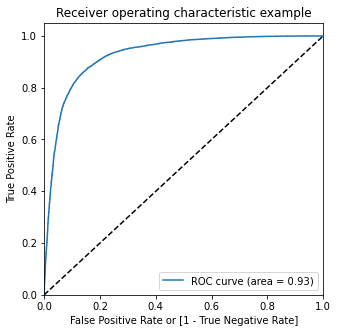

In [97]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

Observation:
* Area under curve of 0.93 indicated the good performance of present model 
* And the graph is leaned towards the left side of the border which means there is good accuracy

##### Finding Optimal Cutoff Point

In [98]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.488514,0,1,1,1,1,1,0,0,0,0,0
1,0,0.092965,0,1,0,0,0,0,0,0,0,0,0
2,0,0.000009,0,1,0,0,0,0,0,0,0,0,0
3,0,0.065528,0,1,0,0,0,0,0,0,0,0,0
4,0,0.055094,0,1,0,0,0,0,0,0,0,0,0


In [99]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.498921  1.000000  0.000000
0.1   0.1  0.742932  0.981902  0.504991
0.2   0.2  0.801716  0.960796  0.643322
0.3   0.3  0.839678  0.938212  0.741568
0.4   0.4  0.854631  0.904179  0.805296
0.5   0.5  0.859527  0.866294  0.852790
0.6   0.6  0.856526  0.823976  0.888936
0.7   0.7  0.842732  0.766410  0.918724
0.8   0.8  0.810378  0.675707  0.944468
0.9   0.9  0.713789  0.453883  0.972575


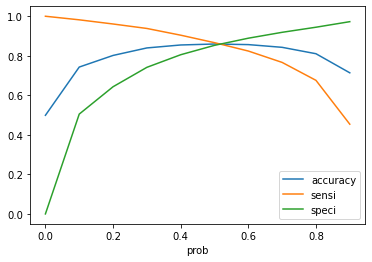

In [100]:
#Plotting the graph above
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the above curve, the optimum point lies slightly ahead of 0.50. 
* We will consider 0.5 as cut-off score

In [101]:
y_train_pred_final['Final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

y_train_pred_final.head(10)

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,Final_predicted
0,0,0.488514,0,1,1,1,1,1,0,0,0,0,0,0
1,0,0.092965,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.000009,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.065528,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.055094,0,1,0,0,0,0,0,0,0,0,0,0
5,0,0.897150,1,1,1,1,1,1,1,1,1,1,0,1
6,0,0.028125,0,1,0,0,0,0,0,0,0,0,0,0
7,0,0.048405,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0.008535,0,1,0,0,0,0,0,0,0,0,0,0
9,1,0.938804,1,1,1,1,1,1,1,1,1,1,1,1


In [102]:
scores=pd.DataFrame(index=['LogReg_Train','LogReg_Test','RF_Train','RF_Test','XGB_Train','XGB_Test','LogRegPCA_Train','LogRegPCA_Test'],
                    columns=['Accuracy','Precision','Specificity','Sensitivity','F1Score'])
scores

,Accuracy,Precision,Specificity,Sensitivity,F1Score
LogReg_Train,NaN,NaN,NaN,NaN,NaN
LogReg_Test,NaN,NaN,NaN,NaN,NaN
RF_Train,NaN,NaN,NaN,NaN,NaN
RF_Test,NaN,NaN,NaN,NaN,NaN
XGB_Train,NaN,NaN,NaN,NaN,NaN
XGB_Test,NaN,NaN,NaN,NaN,NaN
LogRegPCA_Train,NaN,NaN,NaN,NaN,NaN
LogRegPCA_Test,NaN,NaN,NaN,NaN,NaN


Note: The performance metrics for the different models are stored in a dataframed called 'Scores'

In [103]:
accuracy = metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.Final_predicted)
scores['Accuracy']['LogReg_Train']=accuracy
print(accuracy)

0.859527194229453


In [104]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.Final_predicted)
confusion

array([[16232,  2802],
       [ 2534, 16418]], dtype=int64)

In [105]:
# Confusion Matrix
TP = confusion[1,1] # True Positive
TN = confusion[0,0] # True Negative
FP = confusion[0,1] # False Positive
FN = confusion[1,0] # False Negative

In [106]:
# Verifying Sensitivity of logistic regression model
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogReg_Train']=sensitivity
print(sensitivity)

0.8662937948501478


In [107]:
# Verifying Specificity of logistic regression model
specificity = TN / float(TN+FP)
scores['Specificity']['LogReg_Train']=specificity
print(specificity)

0.8527897446674372


In [108]:
# Verifying Precision of logistic regression model
precision = TP / float(TP+FP)
scores['Precision']['LogReg_Train']=precision
print(precision)

0.8542143600416233


In [109]:
# Verifying F1 Score of logistic regression model
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogReg_Train']=F1Score
print(F1Score)

0.860211673477942


#####  Making predictions on the test set

In [110]:
# adding constant
X_test_sm = sm.add_constant(X_test[col])
X_test_sm.shape

(16280, 24)

In [111]:
# Making prediction
y_test_pred = res.predict(X_test_sm)

In [112]:
y_test_pred[:10]

0    0.021852
1    0.911541
2    0.921744
3    0.075358
4    0.069066
5    0.961048
6    0.866805
7    0.965800
8    0.921662
9    0.554811
dtype: float64

In [113]:
# Creating dataframe for prediction dataset
y_pred_final = pd.DataFrame(y_test,columns=['Churn'])
y_pred_final['Churn_Prob']=y_test_pred
y_pred_final.head()

,Churn,Churn_Prob
0,0,0.021852
1,1,0.911541
2,1,0.921744
3,0,0.075358
4,0,0.069066


In [114]:
y_pred_final['Final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

y_pred_final.head(10)

,Churn,Churn_Prob,Final_predicted
0,0,0.021852,0
1,1,0.911541,1
2,1,0.921744,1
3,0,0.075358,0
4,0,0.069066,0
5,1,0.961048,1
6,1,0.866805,1
7,1,0.965800,1
8,1,0.921662,1
9,0,0.554811,1


In [115]:
# Let's check the overall accuracy.
accuracy_test = metrics.accuracy_score(y_pred_final.Churn, y_pred_final.Final_predicted)
scores['Accuracy']['LogReg_Test']=accuracy_test
accuracy_test

0.85497542997543

In [116]:
confusion_test = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.Final_predicted )
confusion_test

array([[6875, 1224],
       [1137, 7044]], dtype=int64)

In [117]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [118]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogReg_Test']=sensitivity
print(sensitivity)

0.861019435276861


In [119]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['LogReg_Test']=specificity
print(specificity)

0.8488702308927027


In [120]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['LogReg_Test']=precision
print(precision)

0.8519593613933236


In [121]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogReg_Test']=F1Score
print(F1Score)

0.856465438628488


##### Applying PCA on the dataset for the high performance models

In [122]:
X_train.shape

(37986, 120)

In [123]:
from sklearn.decomposition import PCA

In [124]:
pca=PCA(random_state=50)

In [125]:
pca.fit(X_train)

PCA(random_state=50)

In [126]:
pca.components_

array([[ 1.25146100e-02,  3.96888068e-02,  8.64606179e-02, ...,
         5.99997156e-02,  4.55926165e-02,  4.91132764e-02],
       [ 1.98181422e-02,  6.15348749e-02,  7.09469524e-02, ...,
         9.54772751e-02, -5.00076718e-02, -2.97346906e-02],
       [-9.22181300e-02,  5.35949387e-02,  1.41293974e-01, ...,
        -3.33084587e-02,  1.01311489e-01,  1.06530894e-01],
       ...,
       [ 1.94364653e-06, -5.91159532e-05,  1.83207029e-05, ...,
         6.47733101e-01, -2.84287491e-05,  1.07571658e-07],
       [ 2.48346227e-16, -1.47116497e-16,  2.29650650e-16, ...,
         1.02599920e-14,  5.78790743e-01, -5.91023445e-01],
       [-0.00000000e+00,  1.23499237e-16, -1.60020762e-16, ...,
        -6.60172609e-15, -6.59764196e-01, -5.18486606e-01]])

In [127]:
# Looking at the explained variance ratio for each component
pca.explained_variance_ratio_

array([1.91684566e-01, 1.50945665e-01, 6.70895650e-02, 5.01966654e-02,
       4.20580918e-02, 3.72321111e-02, 3.18443924e-02, 2.88370417e-02,
       2.19939286e-02, 1.95683375e-02, 1.56555459e-02, 1.44891010e-02,
       1.36211716e-02, 1.31499812e-02, 1.20098435e-02, 1.11629231e-02,
       1.06918264e-02, 9.87676811e-03, 9.27512930e-03, 8.91252380e-03,
       8.67659087e-03, 8.47216276e-03, 7.74496598e-03, 7.55613481e-03,
       7.23170913e-03, 7.08692916e-03, 6.55495098e-03, 6.21339537e-03,
       5.78434643e-03, 5.46710337e-03, 5.26520394e-03, 5.10678302e-03,
       4.93008357e-03, 4.63718002e-03, 4.47826019e-03, 4.32762121e-03,
       4.19213170e-03, 4.16974718e-03, 4.07110323e-03, 3.93289697e-03,
       3.84543898e-03, 3.80560258e-03, 3.64917732e-03, 3.62429137e-03,
       3.52056653e-03, 3.37231471e-03, 3.31553579e-03, 3.23815449e-03,
       3.12610035e-03, 3.03571033e-03, 2.91709671e-03, 2.82773479e-03,
       2.77462565e-03, 2.71600476e-03, 2.64587804e-03, 2.63106568e-03,
      

##### Making a scree plot for the explained variance

In [128]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

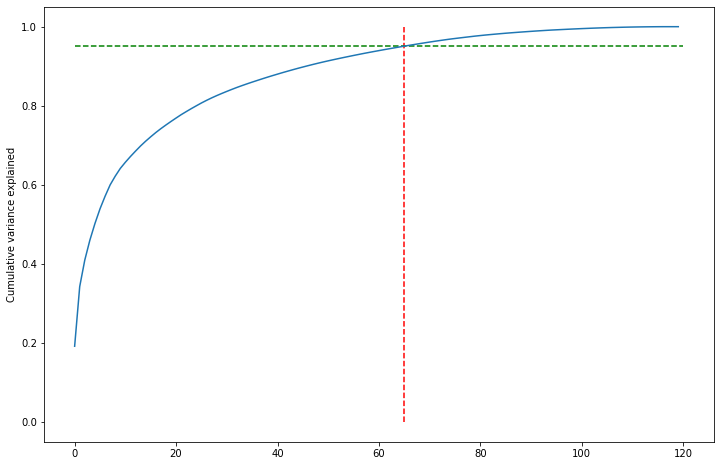

In [129]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=65, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=120, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

Observation: We need to Perform PCA with 66 components

In [130]:
from sklearn.decomposition import IncrementalPCA

In [131]:
pca_final = IncrementalPCA(n_components=66)

In [132]:
df_train_pca = pca_final.fit_transform(X_train)

In [133]:
df_train_pca.shape

(37986, 66)

In [134]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [135]:
corrmat.shape

(66, 66)

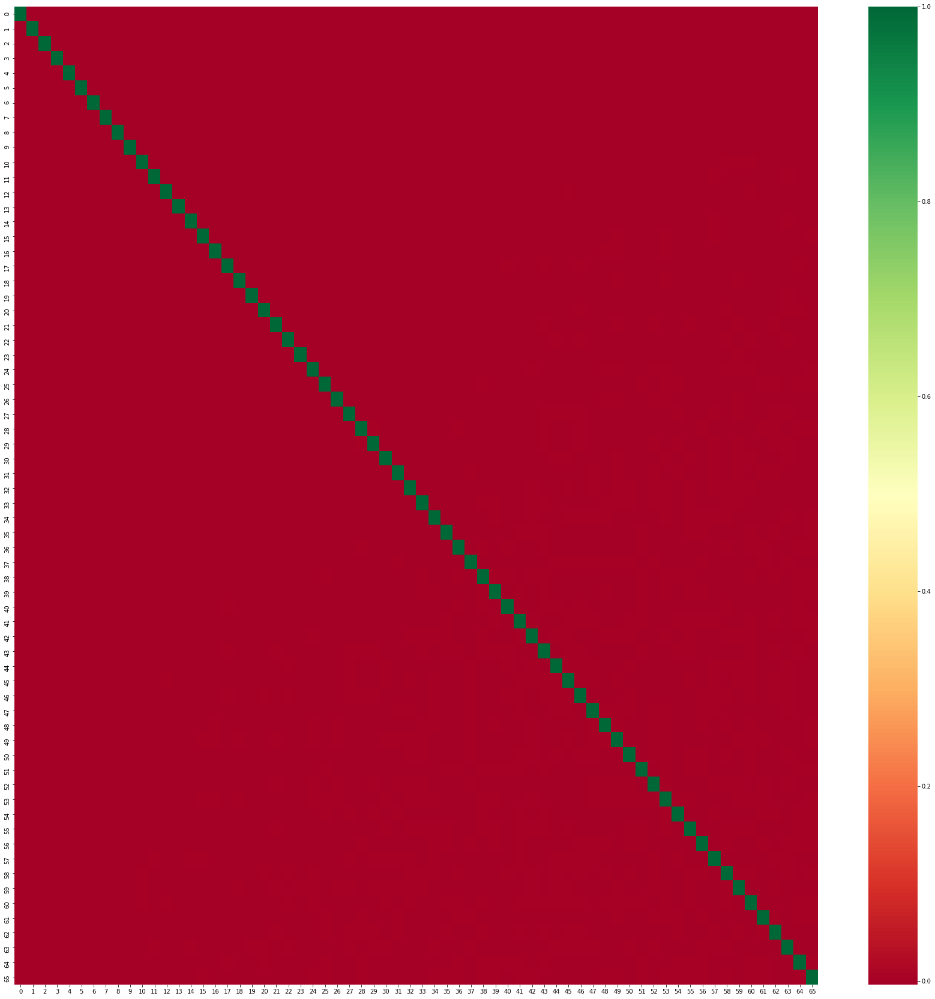

In [136]:
#plot heat map for PCA components
plt.figure(figsize=[30,30])
sns.heatmap(corrmat, cmap='RdYlGn')
plt.show();

Observation: From the above heatmap it is clearly visible that all the PCA components are low in correlation

In [137]:
# Apply PCA on test set
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(16280, 66)

##### Building Random Forest Model 

In [138]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score

In [139]:
rf=RandomForestClassifier(n_estimators=20,max_depth=5,max_features=30,random_state=50,oob_score=True)

In [140]:
%%time
rf.fit(df_train_pca,y_train)

Wall time: 8.48 s


RandomForestClassifier(max_depth=5, max_features=30, n_estimators=20,
                       oob_score=True, random_state=50)

In [141]:
rf.oob_score_

0.829384510082662

In [142]:
from sklearn.metrics import plot_roc_curve

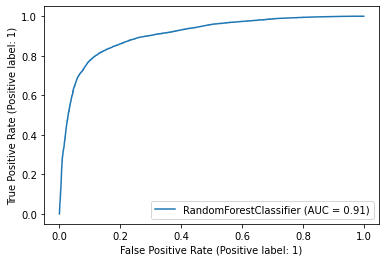

In [143]:
plot_roc_curve(rf, df_train_pca, y_train)
plt.show()

Observation:

- Area under curve of 0.91 indicated the good performance of present model
- And the graph is leaned towards the left side of the border which means there is good accuracy

##### Hyper-parameter tuning for the Random Forest

In [144]:
from sklearn.model_selection import GridSearchCV

In [145]:
rf = RandomForestClassifier(random_state=50, n_jobs=-1)

In [146]:
params = {
    'max_depth': [5,10,20,30],
    'min_samples_leaf': [5,10,20],
    'n_estimators': [10,20,30,50]
}


In [147]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 3,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [148]:
%%time
grid_search.fit(df_train_pca,y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits
Wall time: 2min 51s


GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, random_state=50),
             n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30],
                         'min_samples_leaf': [5, 10, 20],
                         'n_estimators': [10, 20, 30, 50]},
             scoring='accuracy', verbose=1)

In [149]:
grid_search.best_estimator_

RandomForestClassifier(max_depth=30, min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1, random_state=50)

In [150]:
rf_best=grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=30, min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1, random_state=50)

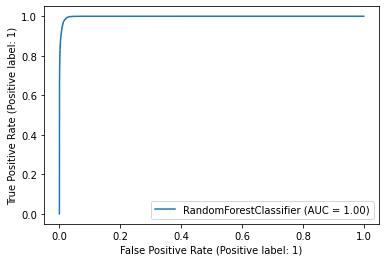

In [151]:
plot_roc_curve(rf_best,df_train_pca,y_train)
plt.show()

Observation:

- Area under curve of 1 for train set indicated the best performance of present model after hyperparameter tuning
- And the graph is leaned towards the left side of the border which means there is good accuracy

In [152]:
rf_best.feature_importances_

array([0.16739793, 0.03366106, 0.0859519 , 0.03984663, 0.00902022,
       0.01457894, 0.00791434, 0.06395525, 0.01769148, 0.01925809,
       0.00981545, 0.0113905 , 0.02155006, 0.01503082, 0.02560723,
       0.03016803, 0.00895057, 0.02237512, 0.00723006, 0.0059749 ,
       0.00606872, 0.00983103, 0.00702053, 0.01129863, 0.00664765,
       0.01675327, 0.00812519, 0.00703485, 0.00784147, 0.00882355,
       0.00684738, 0.0091428 , 0.008017  , 0.00905837, 0.00614125,
       0.01169686, 0.00505593, 0.00751537, 0.00600832, 0.00671243,
       0.00621709, 0.00596574, 0.00818603, 0.00669199, 0.01036667,
       0.01250249, 0.00709114, 0.00624202, 0.01050847, 0.01057878,
       0.01126319, 0.00610257, 0.00837227, 0.00712349, 0.00508272,
       0.00586596, 0.00625582, 0.01196234, 0.00610676, 0.00958229,
       0.01592258, 0.01069499, 0.00780794, 0.00717768, 0.00700724,
       0.00631255])

In [153]:
def evaluate_model(classifier):
    print("Train Accuracy :", accuracy_score(y_train, classifier.predict(df_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, classifier.predict(df_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, classifier.predict(df_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, classifier.predict(df_test_pca)))

In [154]:
evaluate_model(rf_best)

Train Accuracy : 0.9840994050439635
Train Confusion Matrix:
[[18615   419]
 [  185 18767]]
--------------------------------------------------
Test Accuracy : 0.9350122850122851
Test Confusion Matrix:
[[7597  502]
 [ 556 7625]]


In [155]:
y_train_pred_RF=rf_best.predict(df_train_pca)

In [156]:
y_train_pred_RF_Final=pd.DataFrame(y_train,columns=['Churn'])
y_train_pred_RF_Final['Predicted_Churn']=y_train_pred_RF
y_train_pred_RF_Final.head()

,Churn,Predicted_Churn
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [157]:
y_test_pred_RF=rf_best.predict(df_test_pca)
y_test_pred_RF_Final=pd.DataFrame(y_test,columns=['Churn'])
y_test_pred_RF_Final['Predicted_Churn']=y_test_pred_RF
y_test_pred_RF_Final.head()

,Churn,Predicted_Churn
0,0,0
1,1,1
2,1,1
3,0,0
4,0,0


#### Performance on Train Set

In [158]:
confusion_train = metrics.confusion_matrix(y_train_pred_RF_Final.Churn, y_train_pred_RF_Final.Predicted_Churn )
confusion_train

array([[18615,   419],
       [  185, 18767]], dtype=int64)

In [159]:
# Confusion Matrix
TP = confusion_train[1,1] # True Positive
TN = confusion_train[0,0] # True Negative
FP = confusion_train[0,1] # False Positive
FN = confusion_train[1,0] # False Negative

In [160]:
accuracy_train = metrics.accuracy_score(y_train_pred_RF_Final.Churn, y_train_pred_RF_Final.Predicted_Churn)
scores['Accuracy']['RF_Train']=accuracy_train
accuracy_train

0.9840994050439635

In [161]:
# Verifying Sensitivity of prediction on train set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['RF_Train']=sensitivity
print(sensitivity)

0.9902384972562263


In [162]:
# Verifying Specificity of prediction on train set
specificity = TN / float(TN+FP)
scores['Specificity']['RF_Train']=specificity
print(specificity)

0.9779867605337816


In [163]:
# Verifying Precision of prediction on train set
precision = TP / float(TP+FP)
scores['Precision']['RF_Train']=precision
print(precision)

0.9781611591785677


In [164]:
# Verifying F1 Score of prediction on train set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['RF_Train']=F1Score
print(F1Score)

0.9841627772825005


##### Performance on test set

In [165]:
confusion_test = metrics.confusion_matrix(y_test_pred_RF_Final.Churn, y_test_pred_RF_Final.Predicted_Churn )
confusion_test

array([[7597,  502],
       [ 556, 7625]], dtype=int64)

In [166]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [167]:
accuracy_test = metrics.accuracy_score(y_test_pred_RF_Final.Churn, y_test_pred_RF_Final.Predicted_Churn)
scores['Accuracy']['RF_Test']=accuracy_test
accuracy_test

0.9350122850122851

In [168]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['RF_Test']=sensitivity
print(sensitivity)

0.9320376482092654


In [169]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['RF_Test']=specificity
print(specificity)

0.9380170391406346


In [170]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['RF_Test']=precision
print(precision)

0.9382305893933801


In [171]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['RF_Test']=F1Score
print(F1Score)

0.9351238655874418


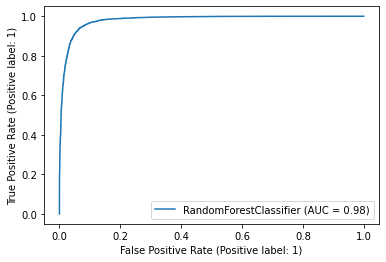

In [172]:
plot_roc_curve(rf_best,df_test_pca,y_test)
plt.show()

Observation:

- Area under curve of 0.98 for test set indicated the best performance
- And the graph is leaned towards the left side of the border which means there is good accuracy

##### Building XGBoost model

In [173]:
import xgboost as xgb

In [174]:
xgclf = xgb.XGBClassifier()
xgclf.fit(df_train_pca, y_train)

[23:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [175]:
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train,
                                                              y_score=xgclf.predict_proba(df_train_pca)[:, 1]))

AUC on train data by XGBoost = 0.9996177193614076


In [176]:
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=xgclf.predict_proba(df_test_pca)[:, 1]))

AUC on test data by XGBoost = 0.9857866649871694


In [177]:
%%time
xgb_model = xgb.XGBClassifier()

# Default-Run of default-hyperparameters
parameters = {'learning_rate': [0.3],
              'max_depth': [6],
              'min_child_weight': [1],
              'n_estimators': [100]}

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=5,
                                       scoring=scorer,
                                       refit=True)

clf_xgb.fit(df_train_pca, y_train)

[23:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 1min 33s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

In [178]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

{'learning_rate': 0.3, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100}
0.9844675930050487
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [179]:
accuracy=metrics.accuracy_score(y_train, clf_xgb.predict(df_train_pca))
print(accuracy)

0.9927604907071026


* Since we are getting high accuracy close to 1, we will reduce learning rate and n_estimatore using hyperparameter tuning to avoid over fitting.

##### Hyperparameter tuning

In [180]:
parameters = {'learning_rate': [0.1],
              'max_depth': [2,4,6],
              'min_child_weight': [1,3],
              'n_estimators': [10,30,50,60]
             }

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=5,
                                       scoring=scorer,
                                       verbose=1,
                                       refit=True)


In [ ]:
%%time
clf_xgb.fit(df_train_pca, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[23:38:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [ ]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

In [ ]:
y_pred_train_XGB=clf_xgb.predict(df_train_pca)

In [ ]:
y_pred_train_XGB_Final=pd.DataFrame(y_train,columns=['Churn'])
y_pred_train_XGB_Final['Predicted_Churn']=y_pred_train_XGB
y_pred_train_XGB_Final.head()

In [ ]:
y_pred_train_XGB_Final.Predicted_Churn.value_counts()

In [ ]:
y_pred_test_XGB=clf_xgb.predict(df_test_pca)
y_pred_test_XGB_Final=pd.DataFrame(y_test,columns=['Churn'])
y_pred_test_XGB_Final['Predicted_Churn']=y_pred_test_XGB
y_pred_test_XGB_Final.head()

##### Check performance on Train data

In [ ]:
confusion_train = metrics.confusion_matrix(y_pred_train_XGB_Final.Churn, y_pred_train_XGB_Final.Predicted_Churn )
confusion_train

In [ ]:
# Confusion Matrix
TP = confusion_train[1,1] # True Positive
TN = confusion_train[0,0] # True Negative
FP = confusion_train[0,1] # False Positive
FN = confusion_train[1,0] # False Negative

In [ ]:
accuracy_train = metrics.accuracy_score(y_pred_train_XGB_Final.Churn, y_pred_train_XGB_Final.Predicted_Churn)
scores['Accuracy']['XGB_Train']=accuracy_train
accuracy_train

In [ ]:
# Verifying Sensitivity of prediction on train set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['XGB_Train']=sensitivity
print(sensitivity)

In [ ]:
# Verifying Specificity of prediction on train set
specificity = TN / float(TN+FP)
scores['Specificity']['XGB_Train']=specificity
print(specificity)

In [ ]:
# Verifying Precision of prediction on train set
precision = TP / float(TP+FP)
scores['Precision']['XGB_Train']=precision
print(precision)

In [ ]:
# Verifying F1 Score of prediction on train set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['XGB_Train']=F1Score
print(F1Score)

##### Check performance on Test data

In [ ]:
confusion_test = metrics.confusion_matrix(y_pred_test_XGB_Final.Churn, y_pred_test_XGB_Final.Predicted_Churn )
confusion_test

In [ ]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [ ]:
accuracy_test = metrics.accuracy_score(y_pred_train_XGB_Final.Churn, y_pred_train_XGB_Final.Predicted_Churn)
scores['Accuracy']['XGB_Test']=accuracy_test
accuracy_test

In [ ]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['XGB_Test']=sensitivity
print(sensitivity)

In [ ]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['XGB_Test']=specificity
print(specificity)

In [ ]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['XGB_Test']=precision
print(precision)

In [ ]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['XGB_Test']=F1Score
print(F1Score)

##### Building Logistic Regression with PCA

In [ ]:
LRPCA=LogisticRegression()

In [ ]:
model_pca = LRPCA.fit(df_train_pca, y_train)

In [ ]:
pred_probs_train = model_pca.predict_proba(df_train_pca)
pred_probs_train

In [ ]:
"{:2.2}".format(metrics.roc_auc_score(y_train, pred_probs_train[:,1]))

In [ ]:
pred_probs_test = model_pca.predict_proba(df_test_pca)
pred_probs_test

In [ ]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))

Observation: Area under curve score of 0.92 for both train and test sets indicated the good performance of model 

In [ ]:
y_pred_train_LR_PCA=model_pca.predict(df_train_pca)
y_pred_train_LR_PCA=pd.DataFrame(y_pred_train_LR_PCA,columns=['Predicted'])
y_pred_train_LR_PCA['Churn']=y_train
y_pred_train_LR_PCA.head()

In [ ]:
y_pred_test_LR_PCA=model_pca.predict(df_test_pca)
y_pred_test_LR_PCA=pd.DataFrame(y_pred_test_LR_PCA,columns=['Predicted'])
y_pred_test_LR_PCA['Churn']=y_test
y_pred_test_LR_PCA.head()

##### Analyse performanse on Train data

In [ ]:
accuracy = metrics.accuracy_score(y_pred_train_LR_PCA.Churn, y_pred_train_LR_PCA.Predicted)
scores['Accuracy']['LogRegPCA_Train']=accuracy
print(accuracy)

In [ ]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_pred_train_LR_PCA.Churn, y_pred_train_LR_PCA.Predicted)
confusion

In [ ]:
# Confusion Matrix
TP = confusion[1,1] # True Positive
TN = confusion[0,0] # True Negative
FP = confusion[0,1] # False Positive
FN = confusion[1,0] # False Negative

In [ ]:
# Verifying Sensitivity of logistic regression model
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogRegPCA_Train']=sensitivity
print(sensitivity)

In [ ]:
# Verifying Specificity of logistic regression model
specificity = TN / float(TN+FP)
scores['Specificity']['LogRegPCA_Train']=specificity
print(specificity)

In [ ]:
# Verifying Precision of logistic regression model
precision = TP / float(TP+FP)
scores['Precision']['LogRegPCA_Train']=precision
print(precision)

In [ ]:
# Verifying F1 Score of logistic regression model
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogRegPCA_Train']=F1Score
print(F1Score)

#####  Making predictions on the test set

In [ ]:
# Let's check the overall accuracy.
accuracy_test = metrics.accuracy_score(y_pred_test_LR_PCA.Churn, y_pred_test_LR_PCA.Predicted)
scores['Accuracy']['LogRegPCA_Test']=accuracy_test
accuracy_test

In [ ]:
confusion_test = metrics.confusion_matrix(y_pred_test_LR_PCA.Churn, y_pred_test_LR_PCA.Predicted )
confusion_test

In [ ]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [ ]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogRegPCA_Test']=sensitivity
print(sensitivity)

In [ ]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['LogRegPCA_Test']=specificity
print(specificity)

In [ ]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['LogRegPCA_Test']=precision
print(precision)

In [ ]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogRegPCA_Test']=F1Score
print(F1Score)

# Conclusion

In [ ]:
scores

Final Recommendation: The following are the predictors that best conveys the importance of features based on Logistic Regression Model without PCA

- Total_data_volume_GoodPhase
- last_day_rch_amt_8
- monthly_3g_8
- sep_vbc_3g
- arpu_7
- sachet_2g_8

Strategy Recommendation to Telecom Service Provider are:
- Giving offers to users interms of Voice and Data
- Giving more flexible plans for Voice and Data
- Providing stable 3G network without any interuption